In [1]:
using Pkg
Pkg.activate(".")
#Pkg.add(["Plots", "Distributions"])
using Plots, Distributions, StatsBase

  Activating project at `~/Julia/OneShot/ConditionalDensities`


In [2]:
#using Plots, Distributions, StatsBase

mutable struct ConditionalDensityArena
    manifoldD::Int
    SD::Int #The S dimension
    mixK::Int #Number of components in the distribution
    outputD::Int #Dimension of the domain of the distribution
    eW::Matrix{Float64}
    dW::Matrix{Float64}
    function ConditionalDensityArena(manifoldD, SD, mixK, outputD)
        #These two matrices fully encode the structure of the mapping, which is Fourier-ish
        eW = randn(manifoldD, SD ÷ 2)
        dW = randn(SD,2mixK + mixK*outputD) #weights, iso stds (per component), plus one outputD mu for each component
        return new(manifoldD, SD, mixK, outputD,eW,dW)
    end
end

stan(x) = x ./ sum(x)

sensible_t(x) = log(exp(x) + 1.5) #Transform to sensible positive range

#Fourier-ish from low dim manifold to S
function lowD2S(X, cdg::ConditionalDensityArena)
    eWtX = cdg.eW'X
    return [cos.(eWtX); sin.(eWtX)]
end

function sample_isoGNN(w,mus,std)
    c = sample(1:length(w),StatsBase.Weights(w))
    mus[:,c] .+ (randn(length(mus[:,c])) .* std[c])
end

function sample_from_conditional_density(S,n,cdg::ConditionalDensityArena)
   theta = cdg.dW'S
    samps = []
    for i in 1:size(theta,2)
        v = theta[:,i]
        w = stan(exp.(v[end-2cdg.mixK+1:end-cdg.mixK] ./ 2))
        stds = sensible_t.(v[end-cdg.mixK+1:end]) .* 3
        mus = reshape(v[1:cdg.mixK*cdg.outputD],cdg.outputD,cdg.mixK)
        push!(samps,stack([sample_isoGNN(w,mus,stds) for k in 1:n]))
    end
    return samps
end

function conditional_distribution(S,cdg::ConditionalDensityArena)
    #To do - not used for training, but will be needed to validate
    #Returns the distribution equivalent to what is sampled from in sample_from_conditional_density(...)
    #Should return a Julia distribution
end

conditional_distribution (generic function with 1 method)

In [3]:
CDG = ConditionalDensityArena(2,32,100,2)

ConditionalDensityArena(2, 32, 100, 2, [-0.8121455765996792 -1.1281748216054766 … 1.121480976782119 -1.1375496037515815; 0.6413875629625473 -1.3756520821531384 … -0.09879606311611296 0.4859923840610735], [1.7360202825620035 1.2293291363949057 … -0.40812807918773575 1.3621707301114987; -0.6119650019797976 1.0391447571705459 … -2.387891426381792 0.6821542894006263; … ; -0.6768942506296697 1.082247197412151 … -1.3565423283265012 0.06495181201693245; -0.4515376815309209 1.0402083032146012 … 0.44559970818558753 0.07494165796102564])

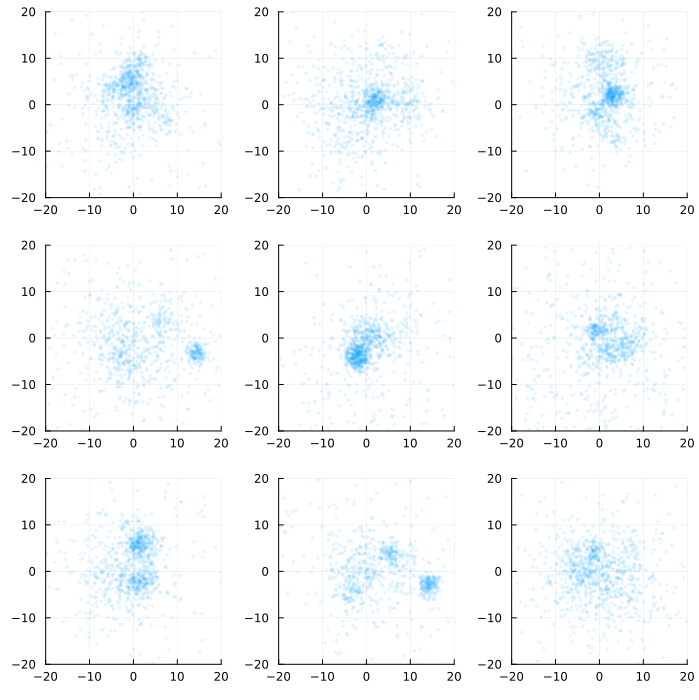

In [5]:
#9 independent samples from the low D space
samples = 9
mX = randn(CDG.manifoldD,samples)
S = lowD2S(mX, CDG)
samps = sample_from_conditional_density(S,1000,CDG)

lay = @layout grid(3,3)
pls = [scatter(sam[1,:],sam[2,:], alpha = 0.1, markersize = 2, markerstrokewidth = 0, label = :none, xlim = (-20,20), ylim = (-20,20)) for sam in samps]
plot(pls..., layout = lay, size = (700,700))

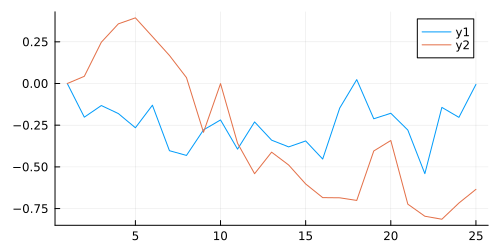

In [6]:
#25 correlated samples from the lowD manifold - showing how the distribution changes smoothly
driftsamps = 25
xdrift = zeros(CDG.manifoldD,driftsamps)
for k in 2:driftsamps
    xdrift[:,k] .= xdrift[:,k-1] .+ randn(CDG.manifoldD)*0.2
    xdrift[:,k] .= xdrift[:,k] .* 0.97
end
plot(xdrift', colosr = ["red", "blue"], size = (500,250))

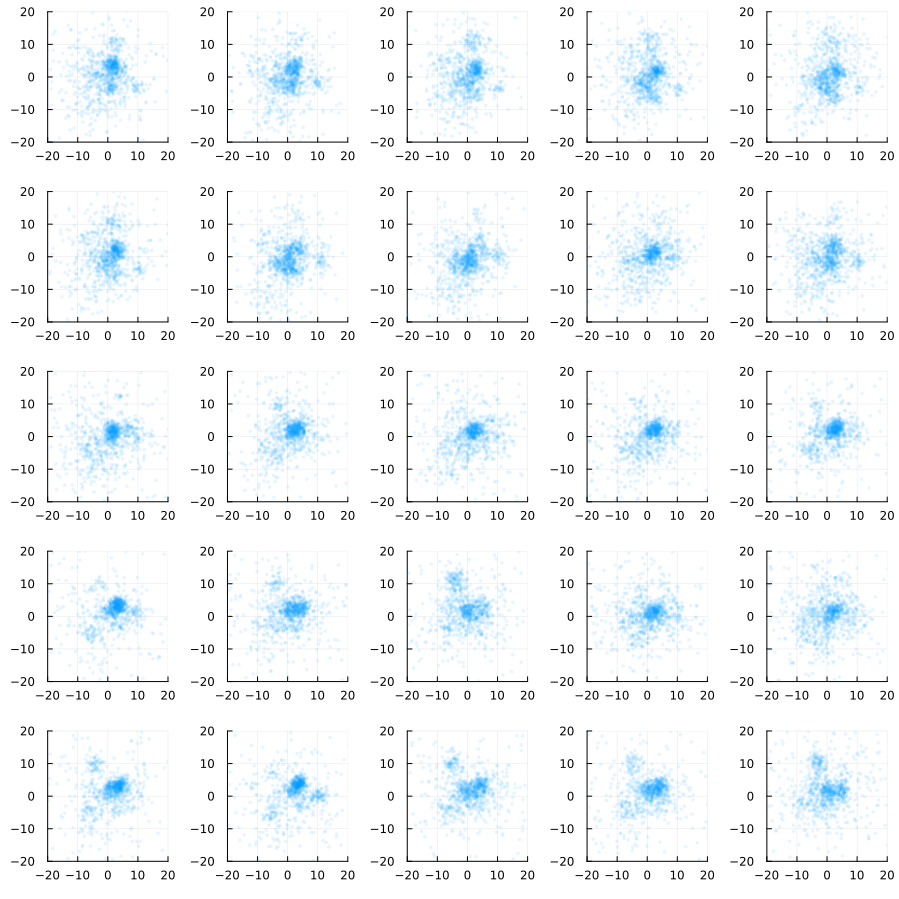

In [7]:
S = lowD2S(xdrift, CDG)
samps = sample_from_conditional_density(S,1000,CDG)

lay = @layout grid(5,5)
pls = [scatter(sam[1,:],sam[2,:], alpha = 0.1, markersize = 2, markerstrokewidth = 0, label = :none, xlim = (-20,20), ylim = (-20,20)) for sam in samps]
plot(pls..., layout = lay, size = (900,900))

In [19]:
#Generating a training dataset:
samples = 100000
mX = randn(CDG.manifoldD,samples)
S = lowD2S(mX, CDG)
@time Y = reshape(stack(sample_from_conditional_density(S,1,CDG)), CDG.manifoldD, samples)
#The Conditional Density Layer would then minimize -log(P(Y|S))

  1.110269 seconds (1.70 M allocations: 1.253 GiB, 21.41% gc time)


2×100000 Matrix{Float64}:
  20.0358    3.06309   6.31355     0.196267  …  -9.20147  -7.97386  -12.7319
 -32.5986  -10.8832   -0.520595  -11.7337        7.34452   9.06459  -29.7118